In [6]:
import matplotlib.pyplot as plt
from pathlib import Path

SEED = 5

from util.plotting import image_grid, plot_image_grid_extremes, plot_distribution
from util.data import parse_dataset

# Directory paths
real_dataset_dir = Path("data/invicta_retinal_fundus")
synth_dataset_dir = Path("data/synth_invicta_retinal_fundus")

# Load CSV dataset
real_dataset = parse_dataset(real_dataset_dir, "input_validation.csv")
synth_dataset = parse_dataset(synth_dataset_dir)

In [7]:
print("Real dataset")
real_dataset

Real dataset


,dataset,modality,class,path,contrast,brightness,sharpness,colorfulness
id,,,,,,,,
119379,eyepacs,dr,0,data/invicta_retinal_fundus/images/119379.png,47.955126,50.658634,13.327313,61.470001
27218,airogs,glaucoma,0,data/invicta_retinal_fundus/images/27218.png,44.792318,81.263611,13.883287,25.213322
184946,eyepacs,dr,0,data/invicta_retinal_fundus/images/184946.png,44.198541,52.398712,11.655010,50.960018
10766,airogs,glaucoma,1,data/invicta_retinal_fundus/images/10766.png,52.725913,93.555107,22.104357,25.816278
134958,eyepacs,dr,0,data/invicta_retinal_fundus/images/134958.png,47.226479,61.037552,13.600880,47.858662
...,...,...,...,...,...,...,...,...
24487,airogs,glaucoma,0,data/invicta_retinal_fundus/images/24487.png,45.435808,63.437275,10.872521,40.002102
136918,eyepacs,dr,0,data/invicta_retinal_fundus/images/136918.png,44.035995,64.818375,11.950054,65.082901
45249,airogs,glaucoma,0,data/invicta_retinal_fundus/images/45249.png,45.084523,78.217682,17.676532,50.318554


In [8]:
print("Synthetic dataset")
synth_dataset

Synthetic dataset


,dataset,modality,class,path
id,,,,
0,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i0.png
1,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i1.png
10,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i10.png
100,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i100.png
1000,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i1000...
...,...,...,...,...
9995,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i9995...
9996,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i9996...
9997,airogs,glaucoma,0,data/synth_invicta_retinal_fundus/images/i9997...


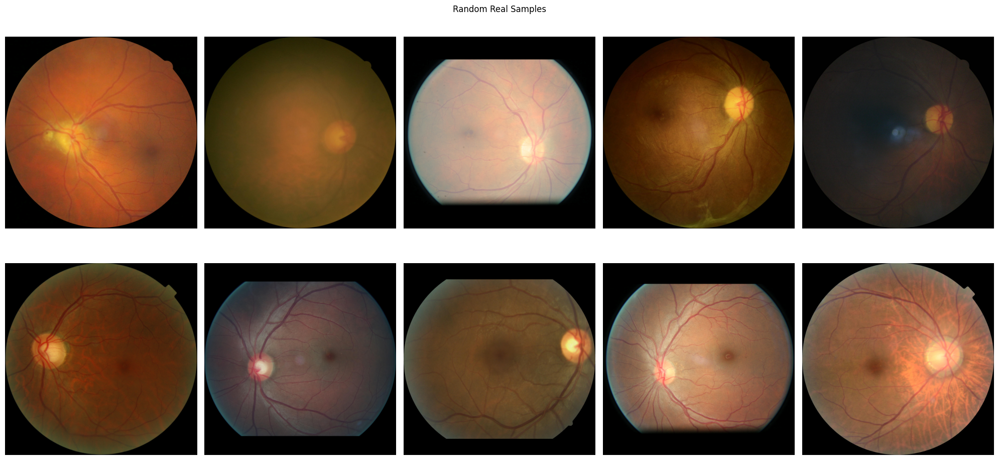

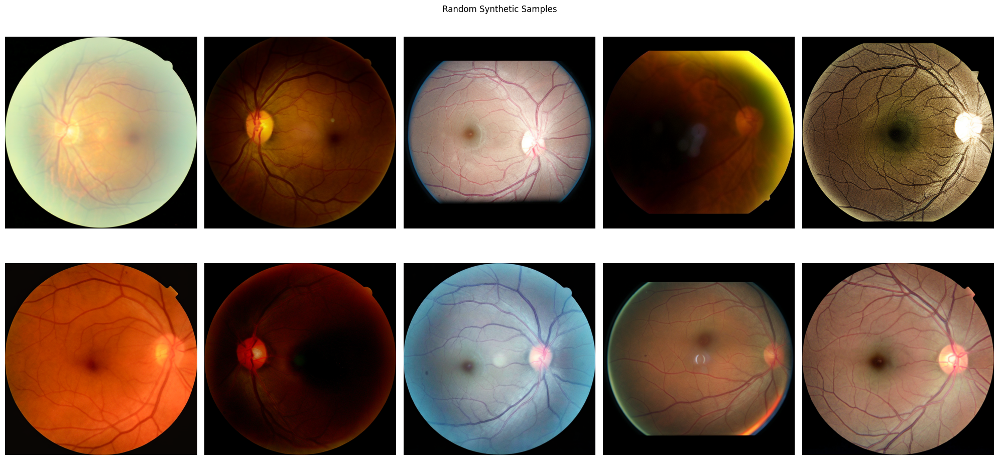

In [9]:
random_sample = real_dataset.sample(10, random_state=SEED)["path"].values
image_grid(random_sample, n_cols=5)
plt.suptitle("Random Real Samples")
plt.show()

random_sample = synth_dataset.sample(10, random_state=SEED)["path"].values
image_grid(random_sample, n_cols=5)
plt.suptitle("Random Synthetic Samples")
plt.show()

# Synthesis Validation

As shown in the dataset sample, the images present in this dataset all have different characteristics. Some are slightly more in focus, others are darker and others are more colorful.

We can use **pyMDMA** metrics to quickly assess the quality of these images and what other **unannotated** concepts they contain.  
For this example, we are going to assess the *Contrast*, *Brightness*, *Sharpness*, and *Colorfulness* of the images with the help of pyMDMA.

The dataset that we are using is too large to load into memory, so we are going to use a **DataLoader** to load the images in batches:

## Feature Extraction

In [ ]:
import torch
from util.data import make_dataloader

from pymdma.image.models.features import ExtractorFactory
from pymdma.image.models.extractor import StandardTransform

device = "cuda" if torch.cuda.is_available() else "cpu"

# define model for feature extraction
extractor_model = ExtractorFactory.model_from_name("dino_vits8")
image_transform = StandardTransform(
    image_size=extractor_model.input_size,
    interpolation=extractor_model.interpolation,
)

def collate_fn(batch):
    return (torch.stack([sample["image"] for sample in batch]),)

# prepare dataloader for real dataset
_, real_loader = make_dataloader(
    dataset_root=real_dataset_dir,
    transform=image_transform,
    batch_size=10,
    collate_fn=collate_fn
)
# extract features
real_features = extractor_model.extract_features_from_dataloader(real_loader, device=device)

# prepare dataloader for synthetic dataset
_, synth_loader = make_dataloader(
    dataset_root=synth_dataset_dir,
    transform=image_transform,
    batch_size=10,
    collate_fn=collate_fn
)
# extract features
synth_features = extractor_model.extract_features_from_dataloader(synth_loader, device=device)



Using cache found in /home/ivsaav/.cache/torch/hub/facebookresearch_dino_main
100%|██████████| 1000/1000 [47:03<00:00,  2.82s/it]


The previous cell takes a long time to execute locally...  
Load the precomputed features from the .npy file in the dataset folder.

In [12]:
import numpy as np
real_features = np.load(real_dataset_dir / "features.npy")
synth_features = np.load(synth_dataset_dir / "features.npy")

## Visualize Feature Space

/home/ivsaav/Projects/invicta_pymdma_2025/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/ivsaav/Projects/invicta_pymdma_2025/.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


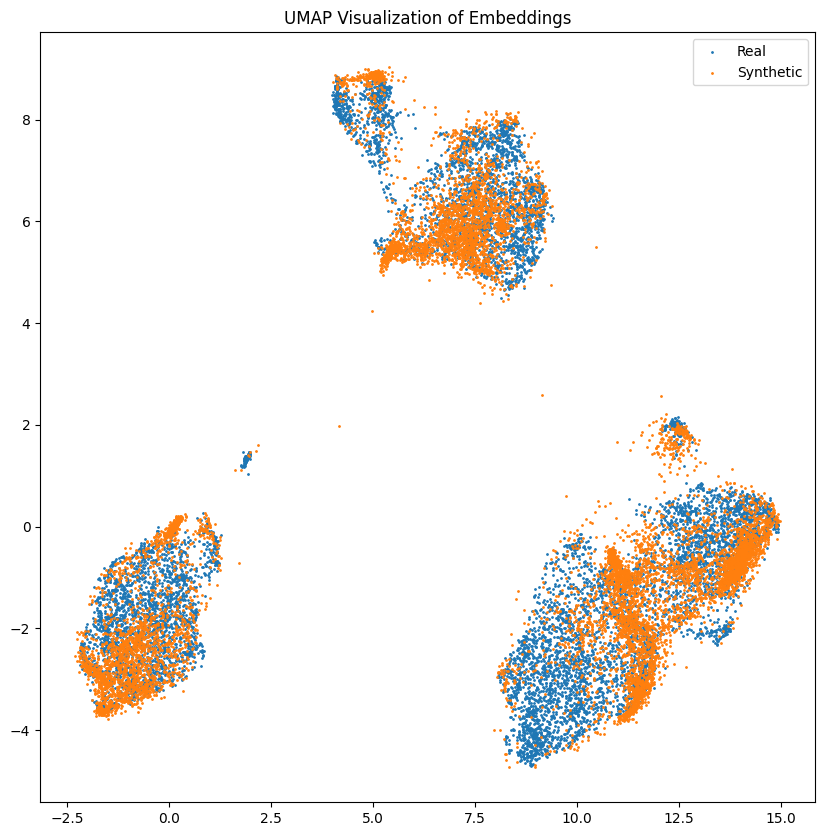

In [13]:
from umap import UMAP

umap = UMAP(n_components=2, random_state=SEED, n_jobs=1)

real_umap = umap.fit_transform(real_features)
synth_umap = umap.transform(synth_features)

plt.figure(figsize=(10, 10))
plt.scatter(real_umap[:, 0], real_umap[:, 1], label="Real", s=1)
plt.scatter(synth_umap[:, 0], synth_umap[:, 1], label="Synthetic", s=1)
plt.title("UMAP Visualization of Embeddings")
plt.legend()
plt.show()


## Improved Precision & Recall

In [24]:
from pymdma.image.measures.synthesis_val import ImprovedPrecision, ImprovedRecall

ip = ImprovedPrecision(k=7)
ip_result = ip.compute(real_features, synth_features)
ip_dataset, ip_instance = ip_result.value

ir = ImprovedRecall(k=7)
ir_result = ir.compute(real_features, synth_features)
ir_dataset, ir_instance = ir_result.value

# save results to the dataset
synth_dataset["ip"] = ip_instance
synth_dataset["ir"] = ir_instance

print("IP: ", ip_dataset)
print("IR: ", ir_dataset)

IP:  0.4955
IR:  0.4041


With the instance level results we can sample a few images that have high precision and recall.

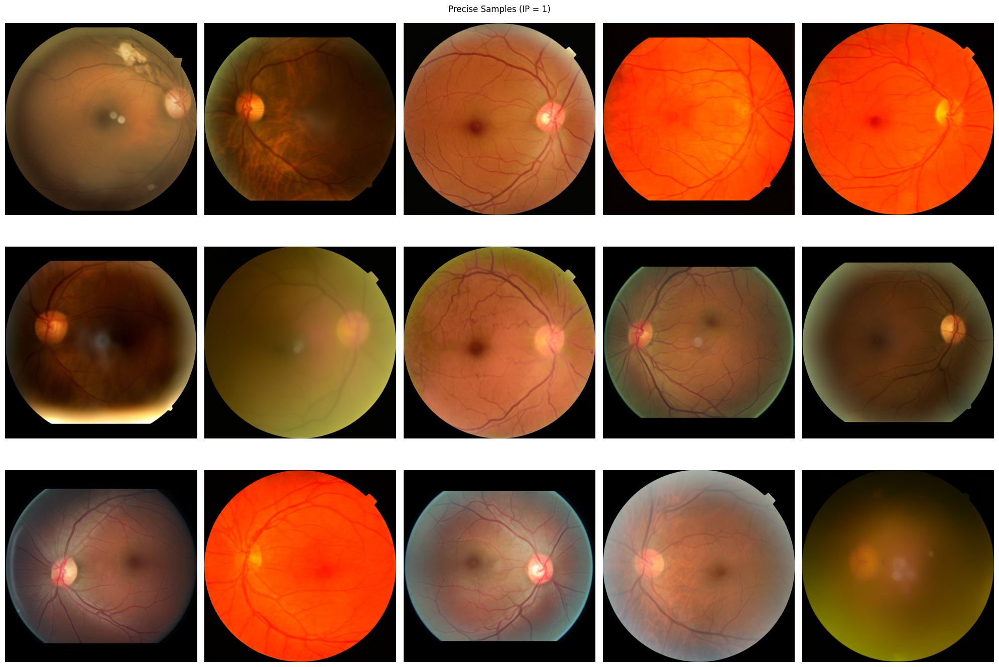

In [25]:
precise_samples = synth_dataset[synth_dataset["ip"] > 0].sample(15, random_state=SEED)
image_grid(precise_samples["path"], n_cols=5, title="Precise Samples (IP = 1)")
plt.show()

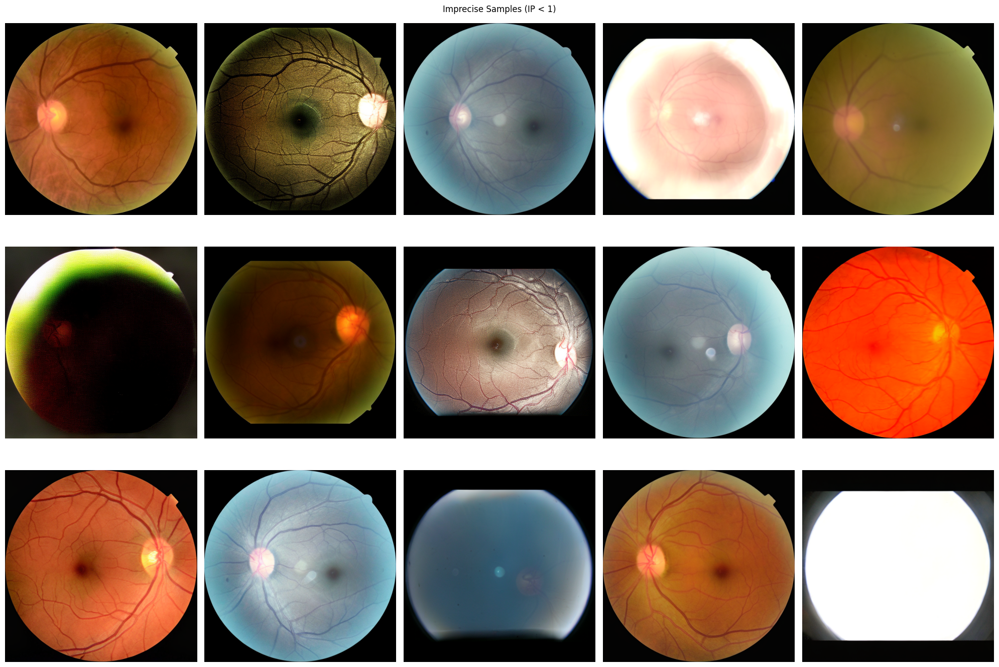

In [16]:
imprecise_samples = synth_dataset[synth_dataset["ip"] < 1].sample(15, random_state=SEED)
image_grid(imprecise_samples["path"], n_cols=5, title="Imprecise Samples (IP < 1)")
plt.show()

## Generated Image Quality Assessment (GIQA)

In [17]:
from pymdma.image.measures.synthesis_val import GIQA

giqa = GIQA()
qs_result = giqa.compute(real_features, synth_features)
qs_dataset, qs_instance = qs_result.value

ds_result = giqa.compute(synth_features, real_features)
ds_dataset, ds_instance = ds_result.value

synth_dataset["giqa_qs"] = qs_instance
real_dataset["giqa_ds"] = ds_instance

print("QS: ", qs_dataset)
print("DS: ", ds_dataset)

QS:  0.9369194092457265
DS:  0.9560094405158561


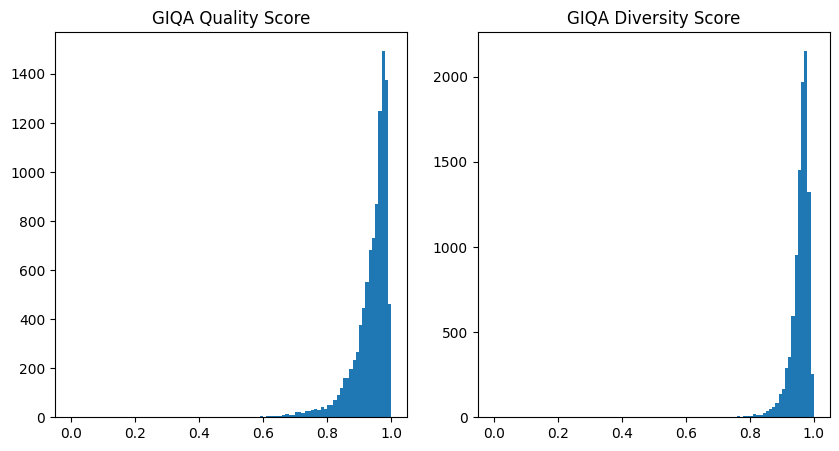

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
qs_result.plot(title="GIQA Quality Score", ax=axs[0], bins=100)
ds_result.plot(title="GIQA Diversity Score", ax=axs[1], bins=100)

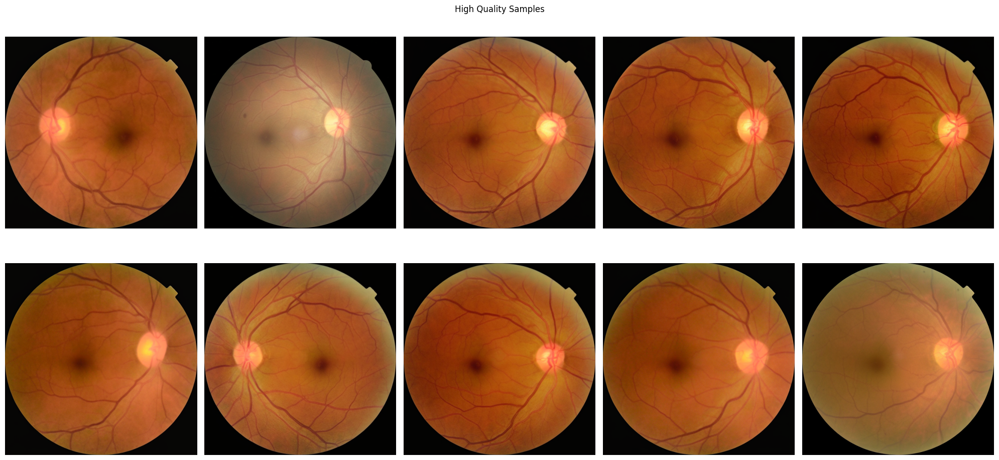

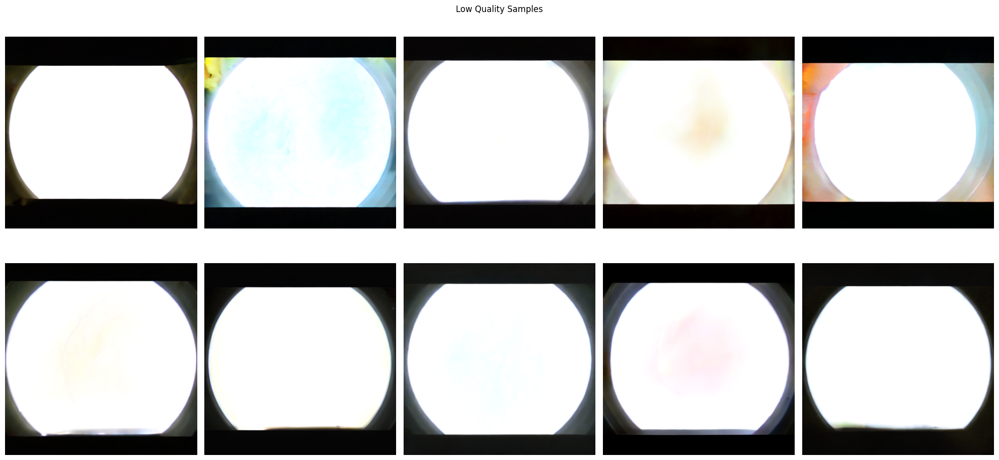

In [19]:
sorted_qs = synth_dataset.sort_values("giqa_qs", ascending=True)

high_qual_samples = sorted_qs.iloc[-10:]
low_qual_samples = sorted_qs.iloc[:10]

image_grid(high_qual_samples["path"], n_cols=5, title="High Quality Samples")
image_grid(low_qual_samples["path"], n_cols=5, title="Low Quality Samples")
plt.show()

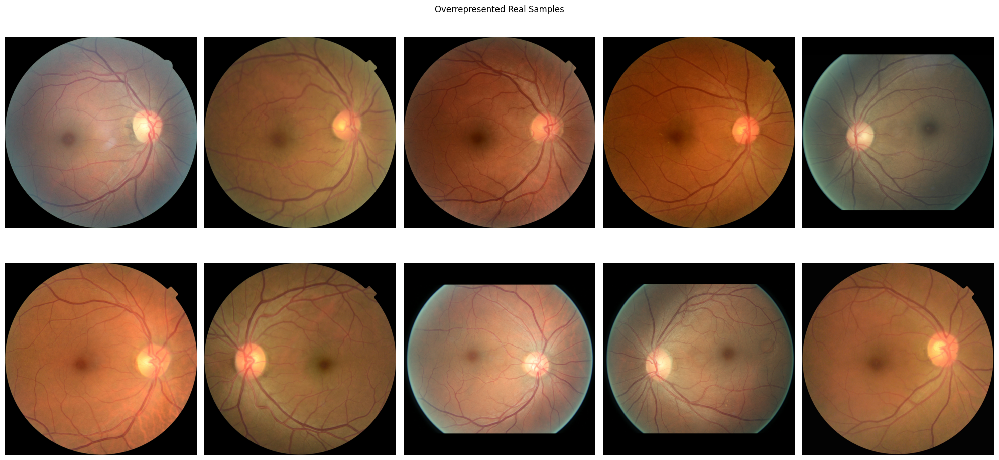

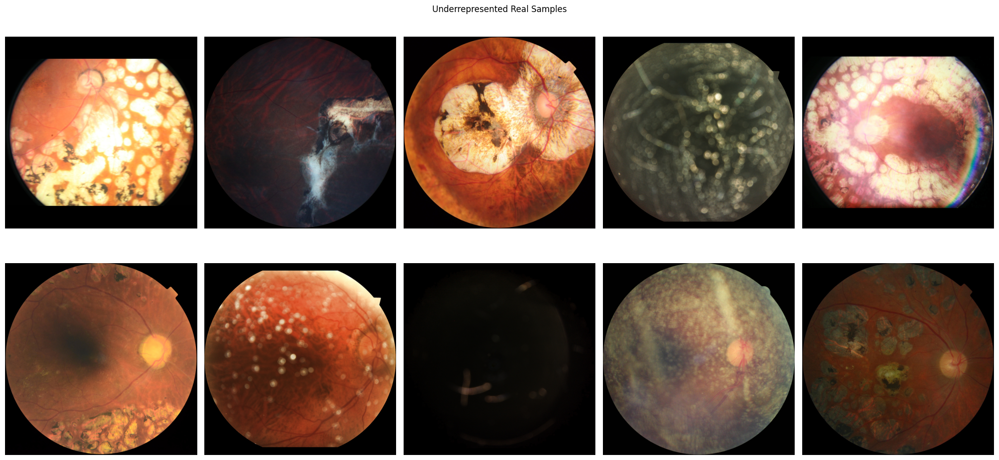

In [21]:
sorted_ds = real_dataset.sort_values("giqa_ds", ascending=True)

high_div_samples = sorted_ds.iloc[-10:]
low_div_samples = sorted_ds.iloc[:10]

image_grid(high_div_samples["path"], n_cols=5, title="Overrepresented Real Samples")
image_grid(low_div_samples["path"], n_cols=5, title="Underrepresented Real Samples")
plt.show()